In [26]:
import gymnasium as gym

import torch

import os

import numpy as np
from torch.utils.tensorboard import SummaryWriter
import torch.nn as nn
from torch.distributions import Independent, Normal
from torch.optim.lr_scheduler import LambdaLR

import tianshou as ts

from tianshou.trainer import onpolicy_trainer
from tianshou.data import Collector, ReplayBuffer, VectorReplayBuffer
from tianshou.policy import PPOPolicy
from tianshou.utils import TensorboardLogger
from tianshou.utils.net.common import Net
from tianshou.utils.net.continuous import ActorProb, Critic

from tianshou.env import VectorEnvNormObs, ShmemVectorEnv

from IPython.display import display, HTML, Image
import pandas as pd

import imageio
import envpool

# Mujoco-Ant

Ant-ის ამოცანაში მოცემული გვაქვს 3d სამყარო, სადაც ჭიანჭველას მაგვარმა არსებამ უნდა ისწავლოს სიარული. Action space უწყვეტია, ამიტომაც ჩვეულებრივი DQN ვერ გადაჭრის ამ ამოცანას და დისკრეტიზაცია მიცდია და ღირებული შედეგი ვერ მივიღე.<br>
<br>
საბოლოოდ გადავწყვიტე PPO ალგორითმის გამოყენება

## PPO Algorithm
PPO ალგორითმი ცდილობს შეზღუდოს პოლისის ცვლა თითო იტერაციაზე. ალგორითმი იყენებს Actor-Critic მეთოდს, ამ მეთოდში სწავლობს ორი ნეირონული ქსელი, პირველი რომელიც გამეროში მოქმედებს და მეორე რომელიც ამ გარემოს ცდილობს ამ ქმედების reward-ის დათვლას. PPO-ში Actor-ი ცდილობს Critic-ის მაქმიზაციას, ხოლო კრიტიკი ჯამური reward-ის სწორედ გამოცნობას.

### ჰიპერპარამეტრები

გამოვიყენე საკმაოდ სტანდარტული ჰიპერ პარამეტრები, რამდენიმე ნაირად ვცადე ამათი გაცვლა, მაგრამ შედეგი დიდად არ იცვლებოდა ან სწავლების დრო მნიშვნელოვნად იზრდებოდა, განსაკუთრებით ნეირონული ქსელის დონეების სიგანის გაზრდისას

In [2]:
# Hyper parameters
TASK = "Ant-v4"

TASK_COMPLETE_THRESHOLD = 2500

SEED = 0
BUFFER_SIZE = 4096
HIDDEN_SIZES = [64, 64]
LEARNING_RATE = 3e-4
GAMMA = 0.99
EPOCH = 100
STEPS_PER_EPOCH = 30_000
STEPS_PER_COLLECT = 2048
REPEAT_PER_COLLECT = 10
BATCH_SIZE = 64

TRAININING_NUM = 1
TEST_NUM = 10

REWARD_NORMALIZATION = True
ENT_COEF = 0.0
GAE_LAMBDA = 0.95
BOUND_ACTION_METHOD = "clip"
LR_DECAY = True
MAX_GRAD_NORM = 0.5
EPS_CLIP = 0.2
DUAL_CLIP = None
VALUE_CLIP = 0
NORM_ADV = 0
RECOMPUTE_ADV = 1
LOGDIR = "log"
RENDER = 0
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
train_envs = env = envpool.make_gymnasium(
            TASK, num_envs=TRAININING_NUM, seed=SEED
        )
test_envs = envpool.make_gymnasium(TASK, num_envs=TEST_NUM, seed=SEED)

train_envs = VectorEnvNormObs(train_envs)
test_envs = VectorEnvNormObs(test_envs, update_obs_rms=False)
test_envs.set_obs_rms(train_envs.get_obs_rms())

In [4]:
state_shape = env.observation_space.shape
action_shape = env.action_space.shape
max_action = env.action_space.high[0]

In [5]:
print(state_shape)
print(action_shape)
print(max_action)

(27,)
(8,)
1.0


In [6]:
np.random.seed(SEED)
torch.manual_seed(SEED)

In [7]:
actor_network = Net(
    state_shape,
    hidden_sizes=HIDDEN_SIZES,
    activation=nn.Tanh,
    device=DEVICE
)

actor = ActorProb(
    actor_network,
    action_shape,
    max_action=max_action,
    unbounded=True,
    device=DEVICE
).to(DEVICE)

In [8]:
critic_network = Net(
    state_shape,
    hidden_sizes=HIDDEN_SIZES,
    activation=nn.Tanh,
    device=DEVICE
)

critic = Critic(critic_network, device=DEVICE).to(DEVICE)

In [9]:
torch.nn.init.constant_(actor.sigma_param, -0.5)

Parameter containing:
tensor([[-0.5000],
        [-0.5000],
        [-0.5000],
        [-0.5000],
        [-0.5000],
        [-0.5000],
        [-0.5000],
        [-0.5000]], device='cuda:0', requires_grad=True)

წონების 0-თან ახლოს ორთოგონალური ინიციალიზაცია აჩქარებს სწავლების პროცეს

In [10]:
for m in list(actor.modules()) + list(critic.modules()):
    if isinstance(m, torch.nn.Linear):
        torch.nn.init.orthogonal_(m.weight, gain=np.sqrt(2))
        torch.nn.init.zeros_(m.bias)

for m in actor.mu.modules():
        if isinstance(m, torch.nn.Linear):
            torch.nn.init.zeros_(m.bias)
            m.weight.data.copy_(0.01 * m.weight.data)

In [11]:
optim = torch.optim.Adam(
        list(actor.parameters()) + list(critic.parameters()), lr=LEARNING_RATE
    )

აქ განსაზღვრულია learning rate-ის შემამცირებელი ფუნქცია

In [12]:
max_update_num = np.ceil(
            STEPS_PER_EPOCH / STEPS_PER_COLLECT
        ) * EPOCH

lr_scheduler = LambdaLR(
            optim, lr_lambda=lambda epoch: 1 - epoch / max_update_num
        )


საწყისი გადანაწილების ფუნქცია, რომელსაც ალგორითმი გამოიყენებს ხმაურის დამატებისთვის და შედეგად exploration-ის მომატებისთვის

In [13]:
def dist(*logits):
        return Independent(Normal(*logits), 1)

In [14]:
policy = PPOPolicy(
        actor,
        critic,
        optim,
        dist,
        discount_factor=GAMMA,
        gae_lambda=GAE_LAMBDA,
        max_grad_norm=MAX_GRAD_NORM,
        ent_coef=ENT_COEF,
        reward_normalization=REWARD_NORMALIZATION,
        action_scaling=True,
        action_bound_method=BOUND_ACTION_METHOD,
        lr_scheduler=lr_scheduler,
        action_space=env.action_space,
        eps_clip=EPS_CLIP,
        value_clip=VALUE_CLIP,
        dual_clip=DUAL_CLIP,
        advantage_normalization=NORM_ADV,
        recompute_advantage=RECOMPUTE_ADV,
    )

In [15]:

if TRAININING_NUM > 1:
    buffer = VectorReplayBuffer(BUFFER_SIZE, len(train_envs))
else:
    buffer = ReplayBuffer(BUFFER_SIZE)

train_collector = Collector(policy, train_envs, buffer, exploration_noise=True)
test_collector = Collector(policy, test_envs)

In [16]:
log_path = os.path.join(LOGDIR, "PPO_ANT")

In [22]:
writer = SummaryWriter(log_path)
logger = TensorboardLogger(writer)

2023-02-20 04:24:45.457353: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-20 04:24:46.320182: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/luka/.local/lib/python3.8/site-packages/cv2/../../lib64::/home/luka/.mujoco/mujoco210/bin
2023-02-20 04:24:46.320322: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/luka/.local/lib/python3.8/si

In [23]:
def save_best_fn(policy):
        state = {"model": policy.state_dict(), "obs_rms": train_envs.get_obs_rms()}
        torch.save(state, os.path.join(log_path, "policy.pth"))

In [24]:
def is_task_completed(test_reward):
    return test_reward > TASK_COMPLETE_THRESHOLD

In [25]:
result = onpolicy_trainer(
            policy,
            train_collector,
            test_collector,
            EPOCH,
            STEPS_PER_EPOCH,
            REPEAT_PER_COLLECT,
            TEST_NUM,
            BATCH_SIZE,
            step_per_collect=STEPS_PER_COLLECT,
            save_best_fn=save_best_fn,
            logger=logger,
            test_in_train=False,
            stop_fn=is_task_completed
        )

Epoch #1: 30720it [02:12, 232.54it/s, env_step=30720, len=150, loss=-0.716, loss/clip=-0.825, loss/ent=6.305, loss/vf=0.218, n/ep=19, n/st=2048, rew=-20.83]                           


Epoch #1: test_reward: -46.188367 ± 70.417048, best_reward: -46.188367 ± 70.417048 in #1


Epoch #2: 30720it [02:11, 232.94it/s, env_step=61440, len=211, loss=-0.285, loss/clip=-0.349, loss/ent=4.744, loss/vf=0.128, n/ep=9, n/st=2048, rew=25.48]                             


Epoch #2: test_reward: 55.812409 ± 64.577960, best_reward: 55.812409 ± 64.577960 in #2


Epoch #3: 30720it [02:12, 231.15it/s, env_step=92160, len=788, loss=-0.563, loss/clip=-0.588, loss/ent=3.493, loss/vf=0.050, n/ep=3, n/st=2048, rew=194.75]                           


Epoch #3: test_reward: 174.687844 ± 172.992466, best_reward: 174.687844 ± 172.992466 in #3


Epoch #4: 30720it [02:40, 191.51it/s, env_step=122880, len=1000, loss=-0.709, loss/clip=-0.723, loss/ent=2.351, loss/vf=0.028, n/ep=2, n/st=2048, rew=595.77]                           


Epoch #4: test_reward: 397.626292 ± 198.933366, best_reward: 397.626292 ± 198.933366 in #4


Epoch #5: 30720it [02:27, 208.40it/s, env_step=153600, len=1000, loss=-0.366, loss/clip=-0.376, loss/ent=1.422, loss/vf=0.020, n/ep=2, n/st=2048, rew=782.26]                           


Epoch #5: test_reward: 737.585209 ± 278.091098, best_reward: 737.585209 ± 278.091098 in #5


Epoch #6: 30720it [02:07, 240.72it/s, env_step=184320, len=695, loss=-0.878, loss/clip=-0.899, loss/ent=0.767, loss/vf=0.042, n/ep=2, n/st=2048, rew=703.02]                            


Epoch #6: test_reward: 547.977762 ± 363.376181, best_reward: 737.585209 ± 278.091098 in #5


Epoch #7: 30720it [02:02, 251.80it/s, env_step=215040, len=1000, loss=-0.135, loss/clip=-0.145, loss/ent=0.160, loss/vf=0.020, n/ep=2, n/st=2048, rew=1083.11]                           


Epoch #7: test_reward: 855.751100 ± 473.795514, best_reward: 855.751100 ± 473.795514 in #7


Epoch #8: 30720it [02:04, 247.18it/s, env_step=245760, len=759, loss=-0.452, loss/clip=-0.480, loss/ent=-0.357, loss/vf=0.056, n/ep=3, n/st=2048, rew=1035.71]                            


Epoch #8: test_reward: 529.420041 ± 432.379182, best_reward: 855.751100 ± 473.795514 in #7


Epoch #9: 30720it [02:02, 250.02it/s, env_step=276480, len=1000, loss=-0.972, loss/clip=-0.985, loss/ent=-0.993, loss/vf=0.025, n/ep=2, n/st=2048, rew=1439.31]                           


Epoch #9: test_reward: 905.662108 ± 626.314355, best_reward: 905.662108 ± 626.314355 in #9


Epoch #10: 30720it [02:02, 251.05it/s, env_step=307200, len=706, loss=-1.093, loss/clip=-1.118, loss/ent=-1.563, loss/vf=0.050, n/ep=2, n/st=2048, rew=1285.14]                            


Epoch #10: test_reward: 1182.571842 ± 425.875373, best_reward: 1182.571842 ± 425.875373 in #10


Epoch #11: 30720it [02:02, 250.11it/s, env_step=337920, len=1000, loss=-0.453, loss/clip=-0.463, loss/ent=-2.243, loss/vf=0.019, n/ep=2, n/st=2048, rew=1237.53]                          


Epoch #11: test_reward: 1319.492886 ± 696.906350, best_reward: 1319.492886 ± 696.906350 in #11


Epoch #12: 30720it [02:00, 254.78it/s, env_step=368640, len=656, loss=0.504, loss/clip=0.481, loss/ent=-2.842, loss/vf=0.046, n/ep=3, n/st=2048, rew=1296.17]                              


Epoch #12: test_reward: 1394.609566 ± 790.293141, best_reward: 1394.609566 ± 790.293141 in #12


Epoch #13: 30720it [02:01, 253.19it/s, env_step=399360, len=605, loss=-0.087, loss/clip=-0.130, loss/ent=-3.571, loss/vf=0.087, n/ep=4, n/st=2048, rew=1063.54]                            


Epoch #13: test_reward: 1757.083770 ± 533.047982, best_reward: 1757.083770 ± 533.047982 in #13


Epoch #14: 30720it [02:04, 246.45it/s, env_step=430080, len=595, loss=-0.488, loss/clip=-0.509, loss/ent=-4.046, loss/vf=0.042, n/ep=2, n/st=2048, rew=1054.40]                            


Epoch #14: test_reward: 1479.306774 ± 776.549674, best_reward: 1757.083770 ± 533.047982 in #13


Epoch #15: 30720it [02:01, 253.70it/s, env_step=460800, len=1000, loss=-0.586, loss/clip=-0.596, loss/ent=-4.545, loss/vf=0.019, n/ep=2, n/st=2048, rew=1641.18]                           


Epoch #15: test_reward: 1983.469628 ± 639.541707, best_reward: 1983.469628 ± 639.541707 in #15


Epoch #16: 30720it [02:00, 254.38it/s, env_step=491520, len=732, loss=-0.002, loss/clip=-0.024, loss/ent=-5.092, loss/vf=0.042, n/ep=3, n/st=2048, rew=1320.61]                            


Epoch #16: test_reward: 2040.090534 ± 666.897842, best_reward: 2040.090534 ± 666.897842 in #16


Epoch #17: 30720it [02:03, 249.24it/s, env_step=522240, len=1000, loss=-1.723, loss/clip=-1.728, loss/ent=-5.548, loss/vf=0.011, n/ep=2, n/st=2048, rew=1638.95]                           


Epoch #17: test_reward: 1835.850156 ± 751.619694, best_reward: 2040.090534 ± 666.897842 in #16


Epoch #18: 30720it [02:01, 253.32it/s, env_step=552960, len=1000, loss=-0.182, loss/clip=-0.192, loss/ent=-5.893, loss/vf=0.020, n/ep=2, n/st=2048, rew=2476.48]                           


Epoch #18: test_reward: 1873.097382 ± 781.943205, best_reward: 2040.090534 ± 666.897842 in #16


Epoch #19: 30720it [02:01, 251.91it/s, env_step=583680, len=1000, loss=-0.643, loss/clip=-0.649, loss/ent=-6.297, loss/vf=0.012, n/ep=2, n/st=2048, rew=2154.96]                           


Epoch #19: test_reward: 1670.341505 ± 737.698267, best_reward: 2040.090534 ± 666.897842 in #16


Epoch #20: 30720it [02:03, 248.78it/s, env_step=614400, len=886, loss=0.280, loss/clip=0.262, loss/ent=-6.591, loss/vf=0.034, n/ep=3, n/st=2048, rew=2385.55]                              


Epoch #20: test_reward: 2494.304023 ± 484.012683, best_reward: 2494.304023 ± 484.012683 in #20


Epoch #21: 30720it [02:03, 248.34it/s, env_step=645120, len=1000, loss=0.519, loss/clip=0.507, loss/ent=-6.897, loss/vf=0.023, n/ep=2, n/st=2048, rew=2122.67]                             


Epoch #21: test_reward: 2045.257950 ± 806.000045, best_reward: 2494.304023 ± 484.012683 in #20


Epoch #22: 30720it [02:00, 254.59it/s, env_step=675840, len=1000, loss=0.655, loss/clip=0.648, loss/ent=-7.354, loss/vf=0.013, n/ep=2, n/st=2048, rew=2301.31]                             


Epoch #22: test_reward: 2366.737400 ± 678.398498, best_reward: 2494.304023 ± 484.012683 in #20


Epoch #23: 30720it [02:00, 253.90it/s, env_step=706560, len=1000, loss=-0.320, loss/clip=-0.327, loss/ent=-7.628, loss/vf=0.014, n/ep=2, n/st=2048, rew=2492.82]                           


Epoch #23: test_reward: 2513.700579 ± 660.399011, best_reward: 2513.700579 ± 660.399011 in #23


In [26]:
result

{'duration': '2981.47s',
 'train_time/model': '1073.96s',
 'test_step': 174056,
 'test_episode': 240,
 'test_time': '70.67s',
 'test_speed': '2463.04 step/s',
 'best_reward': 2513.700579137495,
 'best_result': '2513.70 ± 660.40',
 'train_step': 706560,
 'train_episode': 1150,
 'train_time/collector': '1836.84s',
 'train_speed': '242.74 step/s'}

In [27]:
save_best_fn(policy)

### შედეგები
საბოლოოდ, 600,000 სტეპის შემდეგ ჭიანჭველამ ისწავლა "ჯანმრთელ" არეალში დგომა და ნელ-ნელა მარჯნივ მიდის. რამდენჯერმე მიცდია იგივეს უფრო დიდი ხნით გაშვება, მაგრამ რეალურად 2500-ის არეალში რჩებოდა და დიდად უფრო კარგად არ სწავლობდა, ქვევით, შეგიძლიათ იხილოთ საბოლოო შედეგები და გაუშვათ ნასწავლი მოდელი. 

In [17]:
ckpt = torch.load("./log/PPO_ANT/policy.pth", map_location=DEVICE)
policy.load_state_dict(ckpt["model"])
train_envs.set_obs_rms(ckpt["obs_rms"])
test_envs.set_obs_rms(ckpt["obs_rms"])

In [18]:
policy.eval()
result = test_collector.collect(n_episode=1, render=False)
print("Final reward: {}, length: {}".format(result["rews"].mean(), result["lens"].mean()))

Final reward: 2946.978139474988, length: 1000.0


In [19]:
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

event_acc = EventAccumulator(LOGDIR + "/PPO_ANT")

event_acc.Reload()

tags = event_acc.Tags()

print('Tags in the log file:', tags)

2023-02-20 14:08:08.424010: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-20 14:08:09.551893: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/luka/.local/lib/python3.8/site-packages/cv2/../../lib64::/home/luka/.mujoco/mujoco210/bin
2023-02-20 14:08:09.552128: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/luka/.local/lib/python3.8/si

Tags in the log file: {'images': [], 'audio': [], 'histograms': [], 'scalars': ['test/env_step', 'test/reward', 'test/length', 'test/reward_std', 'test/length_std', 'train/episode', 'train/reward', 'train/length', 'update/loss', 'update/loss/clip', 'update/loss/vf', 'update/loss/ent'], 'distributions': [], 'tensors': [], 'graph': False, 'meta_graph': False, 'run_metadata': []}


In [20]:
import matplotlib.pyplot as plt

def plot_tag(tag):
    data = event_acc.Scalars(tag)

    steps = [x.step for x in data]
    values = [x.value for x in data]
    
    plt.plot(steps, values)
    plt.xlabel('Step')
    plt.ylabel(tag)
    plt.show()


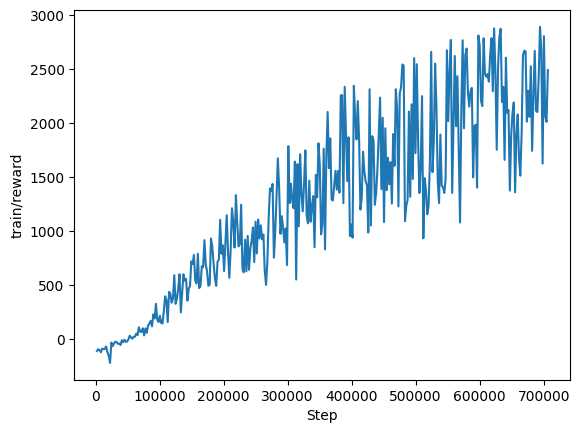

In [21]:
plot_tag('train/reward')


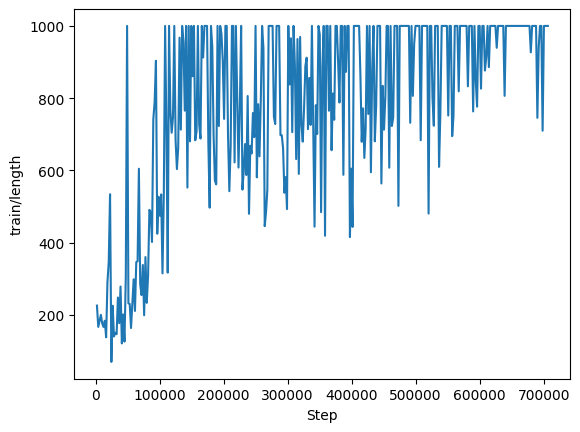

In [22]:
plot_tag('train/length')

In [ ]:
env = gym.make(TASK)
test_envs = ShmemVectorEnv([lambda: gym.make(TASK, render_mode='human')])

test_envs = VectorEnvNormObs(test_envs, update_obs_rms=False)

policy.eval()
collector = ts.data.Collector(policy, test_envs, exploration_noise=True)
collector.collect(n_episode=1, render=1 / 30)

env.close()

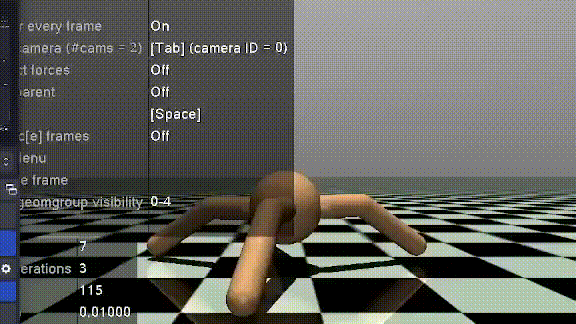

In [28]:
display(Image(filename='gifs/tianshou_out.gif'))

# დასკვნა

საბოლოოდ, tianshou-ს ბიბლიოთეკის გამოყენებით შევძელით ვასწავლოთ ჭიანჭველას სტაბილურად(თუმცა ცოტა ნელა) სიარული

საკმაოდ რთული და შრომატევადი ამოცანა აღმოჩნდა RL. მთავარი სირთულე იყო გამოთვლითი რესურსის ნაკლებობა, ყოველ გაშვებას ძალიან დიდი დრო სჭირდება, ამიტომაც შეცდომების დაშვება ძალიან ცუდი არის.<br>
თუმცა ამ პროექტის წერისას საკმაოდ ბევრი რაღაც ვისწავლე. 